## Download Dataset

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip


--2026-06-24 13:48:17--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.56.26.61, 2600:1417:3f:bb7::317f, 2600:1417:3f:bb9::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.56.26.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  82.2MB/s    in 12s     

2026-06-24 13:48:29 (65.0 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## UnZip the Database

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

## Import Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import keras
from keras.preprocessing.image import load_img
import PIL
import random
import warnings
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [5]:
input_path =[]
labels=[]
for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name=='Cat':
      labels.append(0)
    else:
      labels.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[0],labels[0])


PetImages/Dog/5147.jpg 1


In [6]:
df=pd.DataFrame()
df["Images"]=input_path
df["Label"]=labels
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,Images,Label
0,PetImages/Dog/1384.jpg,1
1,PetImages/Cat/1812.jpg,0
2,PetImages/Cat/2326.jpg,0
3,PetImages/Cat/5677.jpg,0
4,PetImages/Dog/739.jpg,1


In [7]:
clear=[]
for i in df['Images']:
  if not 'jpg' in i:
    clear.append(i)
print(clear)

['PetImages/Cat/Thumbs.db', 'PetImages/Dog/Thumbs.db']


In [8]:
print(len(df['Images']))

25002


In [9]:
df=df[~df["Images"].isin (clear)]
print(len(df['Images']))

25000


In [10]:
import PIL
unwanted_images = []
for image in df['Images']:
    try:
        img = PIL.Image.open(image)
    except:
        unwanted_images.append(image)

In [11]:
print(unwanted_images)
print(len(unwanted_images))

['PetImages/Dog/11702.jpg', 'PetImages/Cat/666.jpg']
2


In [12]:
df=df[~df["Images"].isin(unwanted_images)]
print(len(df['Images']))

24998


## Exploratory Data Analysis

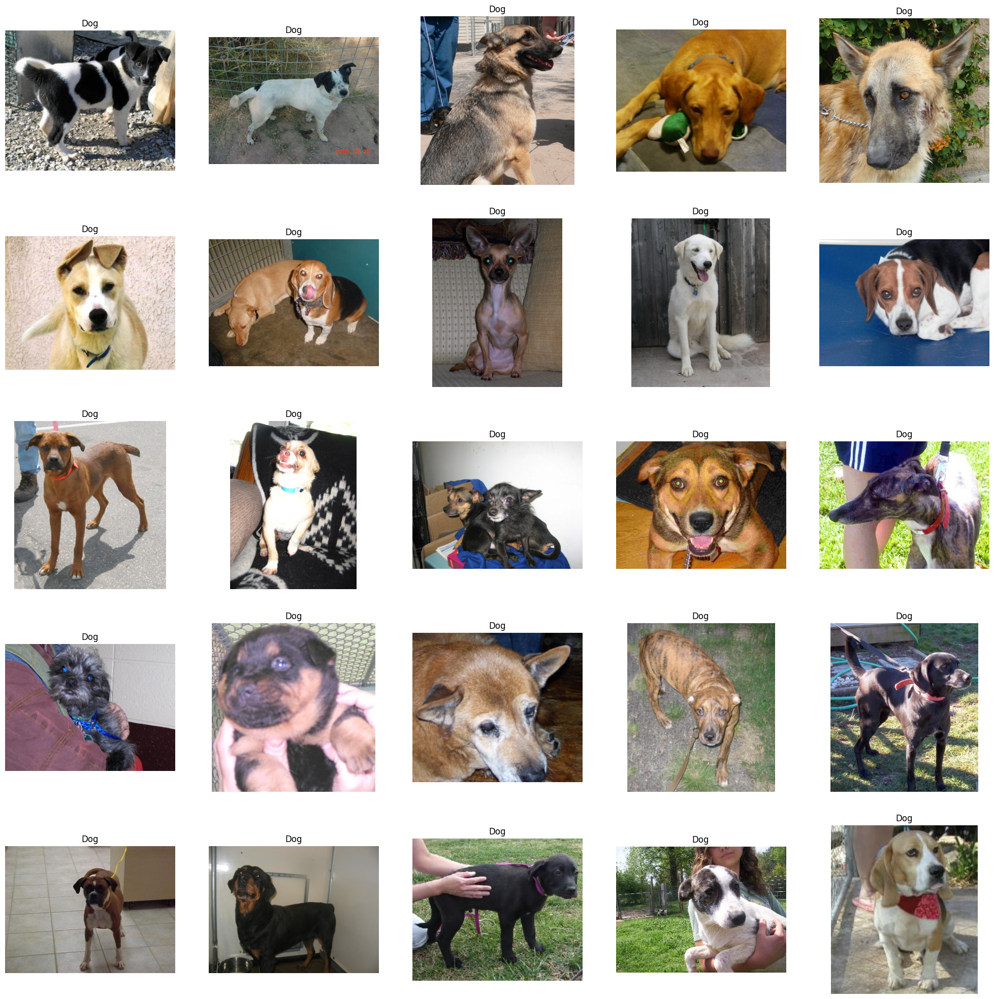

In [13]:
plt.figure(figsize=(25,25))
temp=df[df['Label']==1]['Images']
start = random.randint(0,len(temp))
files=temp[start:start+25]

for index , file in enumerate (files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dog')
  plt.axis('off')

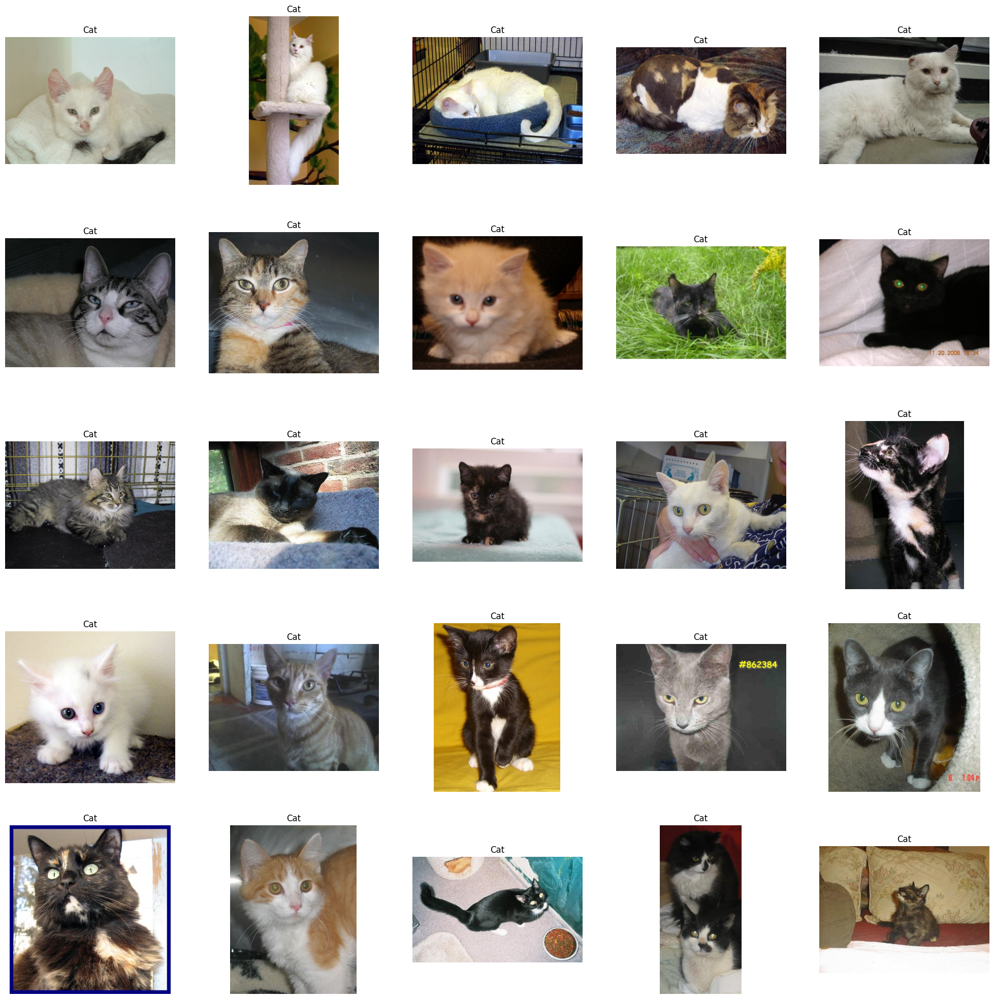

In [14]:
plt.figure(figsize=(25,25))
temp=df[df['Label']==0]['Images']
start = random.randint(0,len(temp))
files=temp[start:start+25]

for index , file in enumerate (files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Cat')
  plt.axis('off')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24998 entries, 0 to 25001
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Images  24998 non-null  object
 1   Label   24998 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 585.9+ KB


In [16]:
df["Label"]=df['Label'].astype('str')

<Axes: xlabel='count', ylabel='Label'>

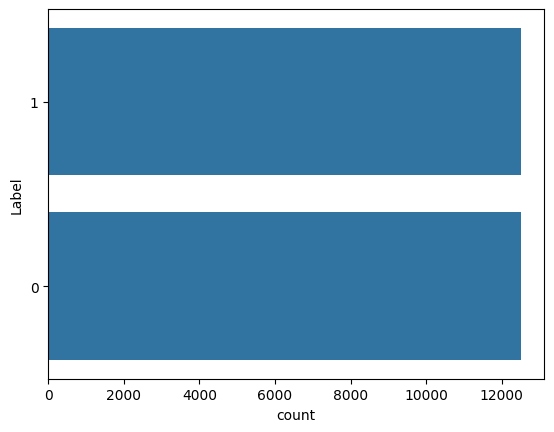

In [17]:

import seaborn as sns
sns.countplot(df['Label'])

In [18]:
from sklearn.model_selection import train_test_split
train ,test=train_test_split(df,test_size=0.2,random_state=42)

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale =1./255,   #--> for Norimalization
    rotation_range=40,      #--> for Augumnetation
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
test_generator = ImageDataGenerator(
    rescale =1./255
)
train_iterator=train_generator.flow_from_dataframe(
    train,x_col='Images',y_col='Label',target_size=(128,128),class_mode='binary',batch_size=32
)
test_iterator=test_generator.flow_from_dataframe(
    test,x_col='Images',y_col='Label',target_size=(128,128),class_mode='binary',batch_size=32
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


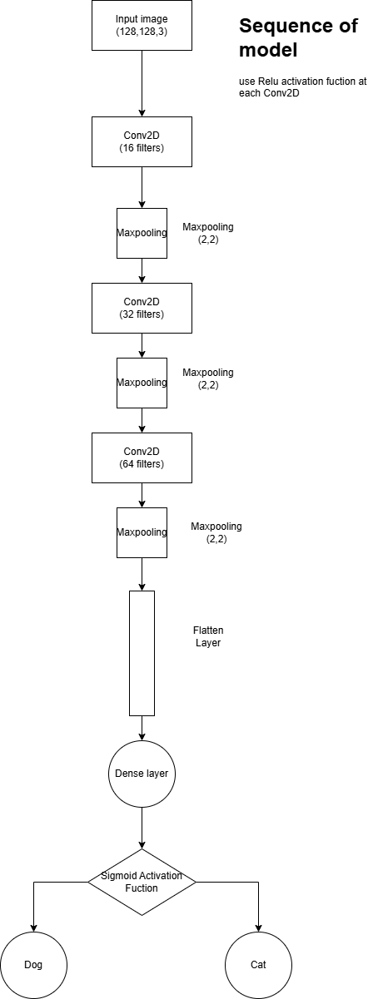

In [32]:
from keras import Sequential
from keras.layers import Conv2D , MaxPool2D ,Flatten ,Dense,Dropout ,BatchNormalization
model=Sequential([
      #convolutional layer 1
      Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
      MaxPool2D((2,2)),

      #convolutional layer 2
      Conv2D(32,(3,3),activation='relu'),
      MaxPool2D((2,2)),

      #convolutional layer 3
      Conv2D(64,(3,3),activation='relu'),
      MaxPool2D((2,2)),

      #Flatten layer
      Flatten(),

      #fully connected layers
      Dense(1024,activation='relu'),
      Dense(512,activation='relu'),
      BatchNormalization(),
      Dropout(0.5),
      Dense(256,activation='relu'),
      Dropout(0.3), # Drops 50% of neurons to prevent overfitting

      Dense(128,activation='relu'),
      Dropout(0.3),

      #output layer
      Dense(1,activation='sigmoid')
    ])

In [33]:

model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1024)           │    12,846,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,560,865 (51.73 MB)

 Trainable params: 13,559,841 (51.73 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [34]:
training_result=model.fit(train_iterator,epochs=40)

Epoch 1/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 116s 176ms/step - accuracy: 0.6371 - loss: 0.6483
Epoch 2/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 105s 168ms/step - accuracy: 0.7170 - loss: 0.5599
Epoch 3/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 104s 166ms/step - accuracy: 0.7527 - loss: 0.5180
Epoch 4/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 105s 168ms/step - accuracy: 0.7727 - loss: 0.4877
Epoch 5/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 104s 166ms/step - accuracy: 0.7862 - loss: 0.4626
Epoch 6/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 103s 165ms/step - accuracy: 0.8019 - loss: 0.4425
Epoch 7/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 104s 166ms/step - accuracy: 0.8127 - loss: 0.4236
Epoch 8/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 106s 169ms/step - accuracy: 0.8242 - loss: 0.4006
Epoch 9/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 104s 167ms/step - accuracy: 0.8299 - loss: 0.3900
Epoch 10/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 103s 165ms/step - accuracy: 0.8356 - loss: 0.3811
Epoch 11/40
625/625 ━━━━━━━━━━━━━━━━━━━━ 102s 163ms/step - accuracy: 0.8406 - loss: 0.3596
Epoch 12

In [35]:
test_result=model.evaluate(test_iterator)

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.9048 - loss: 0.2400


## Test Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Dog


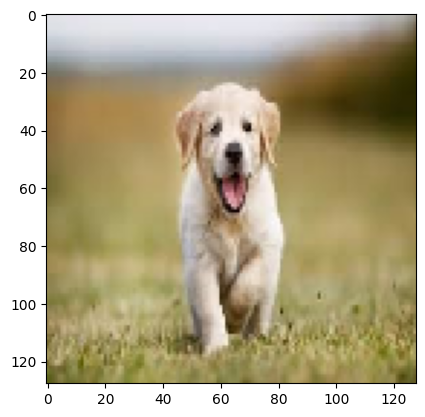

In [37]:
image_path = "/content/dog_image_test.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
plt.imshow(img)
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Cat


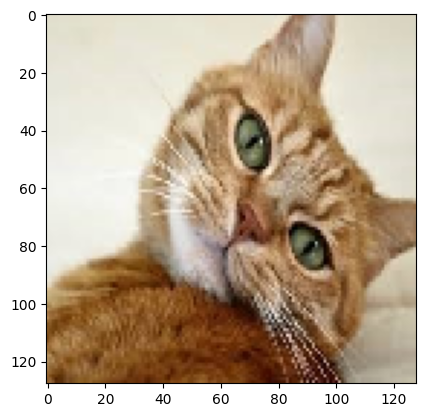

In [38]:
image_path = "/content/cat_image_test.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
plt.imshow(img)
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)